In [1]:
import warnings

import pandas as pd

warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

import scanpy as sc
import numpy as np
#import tensorflow as tf

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [1]:
#import altair as alt
import pertpy as pt

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sccoda_model = pt.tl.Sccoda()


In [4]:
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(8,8))
adata=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/final_fb_adatas/adata_all_6150_umap5.h5ad.paga2.annotated9')
 
# sc.pl.umap(adata, color='Site_status_binary', size=10, cmap='Spectral_r', frameon=False, 

#            show=False)
# Define your colors]

color_map = {
    #"Control_eczema": "#36acca",
    #"Control_psoriasis": "#36acca",
   # "Eczema": "#fad09f",
    "Lesional": "#f33033", 
    "Nonlesional": "#b0e0f0", 
}
#adata=adata[adata.obs["Patient_status"]!="Neurofibroma"]
# Ensure 'batch' is a categorical type
adata.obs['Site_status_binary'] = adata.obs['Site_status_binary'].astype('category')

# Set the color map for the categorical values
batch_colors = adata.obs['Site_status_binary'].cat.categories.map(color_map).to_list()
adata.uns['Site_status_binary_colors'] = batch_colors



In [5]:
RENAME = {"F1: Regenerative": "F1: Epithelium-associated"}
adata.obs["test13"]=adata.obs["test13"].map(RENAME).fillna(adata.obs["test13"])

In [6]:
adata.obs["test13"].value_counts()

test13
F2: Universal                     74159
F1: Superficial                   66365
F2/3: Stroma_PPARG+               42757
F3: FRC-like                      41392
F7: Fascia-like myofibroblast     38540
F4: DS_DPEP1+                     31161
F6: Myofibroblast                 26441
F5: NGFR+                          9580
F4: TNN+COCH+                      8636
F5: RAMP1+                         6922
F6: Inflammatory myofibroblast     6352
F_Fascia                           2978
F4: DP_HHIP+                       1993
Name: count, dtype: int64

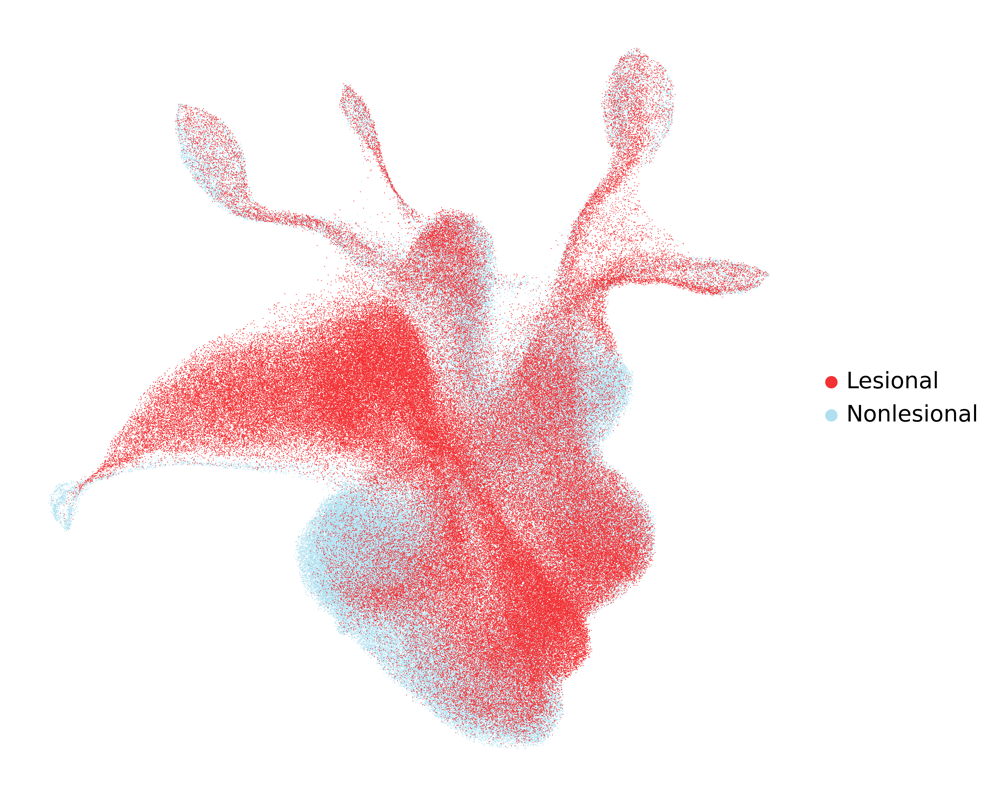

In [7]:
sc.pl.umap(
    adata,
    color=["Site_status_binary"],
    frameon=False,
    s=1,
    wspace=0.6,
    title='',
   # save="fig3_sitestatusbinary_atlascolours.png"
)



In [11]:
adata.obs["condition"]=adata.obs["Site_status_binary"].copy()
adata.obs["condition"].value_counts()

condition
Lesional       184139
Nonlesional    166520
Name: count, dtype: int64

In [12]:
# Ensure the "condition" column is categorical and set the order explicitly
adata.obs["condition"] = pd.Categorical(
    adata.obs["condition"], categories=["Nonlesional", "Lesional"], ordered=True
)

In [13]:
sccoda_data = sccoda_model.load(
    adata,
    type="cell_level",
    generate_sample_level=True,
    cell_type_identifier="test13",
    sample_identifier="sample_id",
    covariate_obs=["condition"],
)
sccoda_data

MuData object with n_obs × n_vars = 351007 × 36614
  2 modalities
    rna:	350659 x 36601
      obs:	'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'DonorID', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'lvl3_annotation', 'lvl2_annotation', 'lvl0_annotation', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid', 'leiden_res0.2', 'Site_status_binary', 'atlas_status_reynolds', 'atlas_status', 'Site_status2', 'Patient_status2', 'Sex_original', 'leiden_res1', 'test', 'corefb_names', 'lvl3_annotation_uncert', 'lvl3_annotation_pred', 'leiden_res0.5', 'merged_annotations', 'test3', 'test4', 'test5', 'test6', 'leiden_res0.7', 'test7', 'lvl3_annotation_pred2', 'test8', 'test9', 'test10', 'test11', 'disease_category', 'macfb', 'macfb2', 'test12', 'test13', 'test14', 'test15', 'test16', 'test13_simple', 'disease_category_orig', 'condition', 'scCODA_sample_id'
      var:	'highly_variable_nbatches', 'highly_variable'
      uns:	'Site_status_binary_colors', 'leiden', 'leiden_res0.5_colors', 'leiden_res0.7_colors', 'leiden_res1', 'leiden_res1_colors', 'log1p', 'macfb2_colors', 'neighbors', 'paga', 'rank_genes_groups', 'test10_colors', 'test11_colors', 'test13_simple_colors', 'test14_colors', 'test15_colors', 'test16_colors', 'test3', 'test4', 'test4_colors', 'test5_colors', 'test6_colors', 'test7_colors', 'test8_colors', 'test9_colors', 'umap'
      obsm:	'X_scvi', 'X_umap', 'connectivities', 'distances'
      layers:	'counts'
      obsp:	'connectivities', 'distances'
    coda:	348 x 13
      obs:	'condition', 'sample_id'
      var:	'n_cells'

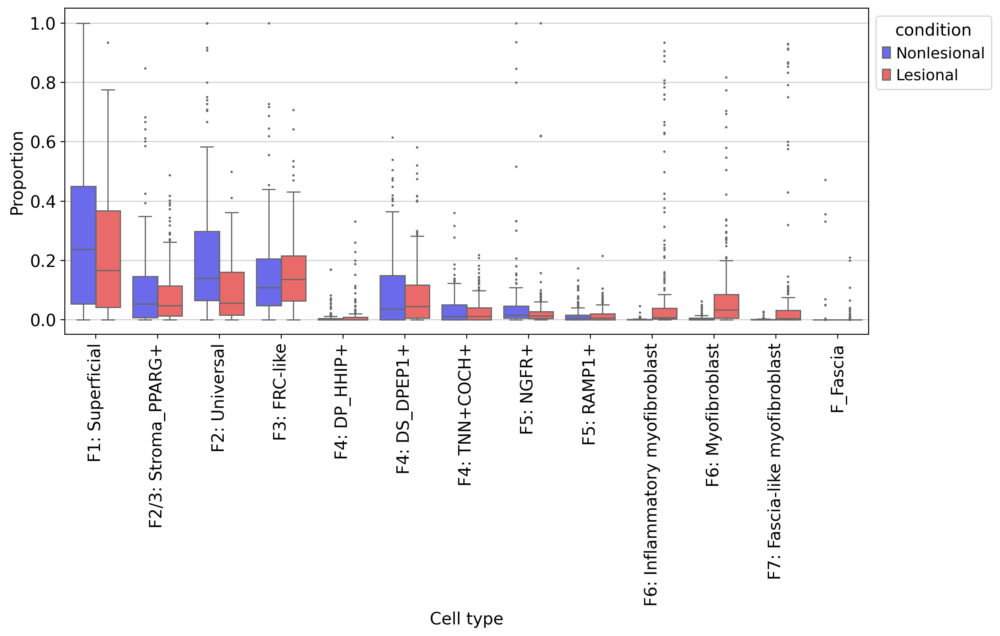

In [16]:
sccoda_model.plot_boxplots(
    sccoda_data,
    modality_key="coda",
    feature_name="condition",
    figsize=(12, 5),
    #add_dots=True,
    palette="seismic"
#    args_swarmplot={"palette": ["red"]},
)
plt.show()

